In [1]:
!pip3 install numpy


In [2]:
!pip3 install --upgrade pip

In [3]:
!pip3 install pandas

In [4]:
import numpy as np
import pandas as pd


In [5]:
data = pd.read_csv("Combined_Jobs_Final.csv")


In [6]:
data.head()

,Job.ID,Provider,Status,Slug,Title,Position,Company,City,State.Name,State.Code,...,Industry,Job.Description,Requirements,Salary,Listing.Start,Listing.End,Employment.Type,Education.Required,Created.At,Updated.At
0,111,1,open,palo-alto-ca-tacolicious-server,Server @ Tacolicious,Server,Tacolicious,Palo Alto,California,CA,...,Food and Beverages,Tacolicious' first Palo Alto store just opened...,NaN,8.00,NaN,NaN,Part-Time,NaN,2013-03-12 02:08:28 UTC,2014-08-16 15:35:36 UTC
1,113,1,open,san-francisco-ca-claude-lane-kitchen-staff-chef,Kitchen Staff/Chef @ Claude Lane,Kitchen Staff/Chef,Claude Lane,San Francisco,California,CA,...,Food and Beverages,\r\n\r\nNew French Brasserie in S.F. Financia...,NaN,0.00,NaN,NaN,Part-Time,NaN,2013-04-12 08:36:36 UTC,2014-08-16 15:35:36 UTC
2,117,1,open,san-francisco-ca-machka-restaurants-corp-barte...,Bartender @ Machka Restaurants Corp.,Bartender,Machka Restaurants Corp.,San Francisco,California,CA,...,Food and Beverages,We are a popular Mediterranean wine bar and re...,NaN,11.00,NaN,NaN,Part-Time,NaN,2013-07-16 09:34:10 UTC,2014-08-16 15:35:37 UTC
3,121,1,open,brisbane-ca-teriyaki-house-server,Server @ Teriyaki House,Server,Teriyaki House,Brisbane,California,CA,...,Food and Beverages,● Serve food/drinks to customers in a profess...,NaN,10.55,NaN,NaN,Part-Time,NaN,2013-09-04 15:40:30 UTC,2014-08-16 15:35:38 UTC
4,127,1,open,los-angeles-ca-rosa-mexicano-sunset-kitchen-st...,Kitchen Staff/Chef @ Rosa Mexicano - Sunset,Kitchen Staff/Chef,Rosa Mexicano - Sunset,Los Angeles,California,CA,...,Food and Beverages,"Located at the heart of Hollywood, we are one ...",NaN,10.55,NaN,NaN,Part-Time,NaN,2013-07-17 15:26:18 UTC,2014-08-16 15:35:40 UTC


In [7]:
data.shape

(84090, 23)

In [8]:
data.isnull().sum()

Job.ID                    0
Provider                  0
Status                    0
Slug                      0
Title                     0
Position                  0
Company                2271
City                    135
State.Name              171
State.Code              171
Address               84054
Latitude                  0
Longitude                 0
Industry              83823
Job.Description          56
Requirements          84090
Salary                83861
Listing.Start           683
Listing.End             167
Employment.Type          10
Education.Required      267
Created.At                0
Updated.At                0
dtype: int64

In [9]:
data=data[['Status', 'Title', 'Position', 'Company', 'Job.Description']]

In [10]:
len(data)

84090

In [11]:
# Fill missing values with the most frequent value (mode)
data['Status'].fillna(data['Status'].mode()[0], inplace=True)
data['Title'].fillna(data['Title'].mode()[0], inplace=True)
data['Position'].fillna(data['Position'].mode()[0], inplace=True)
data['Company'].fillna(data['Company'].mode()[0], inplace=True)
data['Job.Description'].fillna(data['Job.Description'].mode()[0], inplace=True)

/var/folders/2t/bv9pyvvs1y39zktfxmgd8bnc0000gn/T/ipykernel_2853/2895861320.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Status'].fillna(data['Status'].mode()[0], inplace=True)
/var/folders/2t/bv9pyvvs1y39zktfxmgd8bnc0000gn/T/ipykernel_2853/2895861320.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting 

In [12]:
data.isnull().sum()

Status             0
Title              0
Position           0
Company            0
Job.Description    0
dtype: int64

In [13]:
# Summary statistics for categorical columns

summary = data.describe(include=['object'])
summary

,Status,Title,Position,Company,Job.Description
count,84090,84090,84090,84090,84090
unique,1,41861,36245,8335,59269
top,open,Administrative Assistant @ OfficeTeam,Administrative Assistant,Accountemps,Retail Sales Associate - Part-TimeMarketSource...
freq,84090,1285,1414,14742,645


In [14]:
!pip3 install matplotlib

In [15]:
!pip3 install seaborn

In [16]:
!pip3 install nbformat


In [17]:
!pip3 install plotly

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

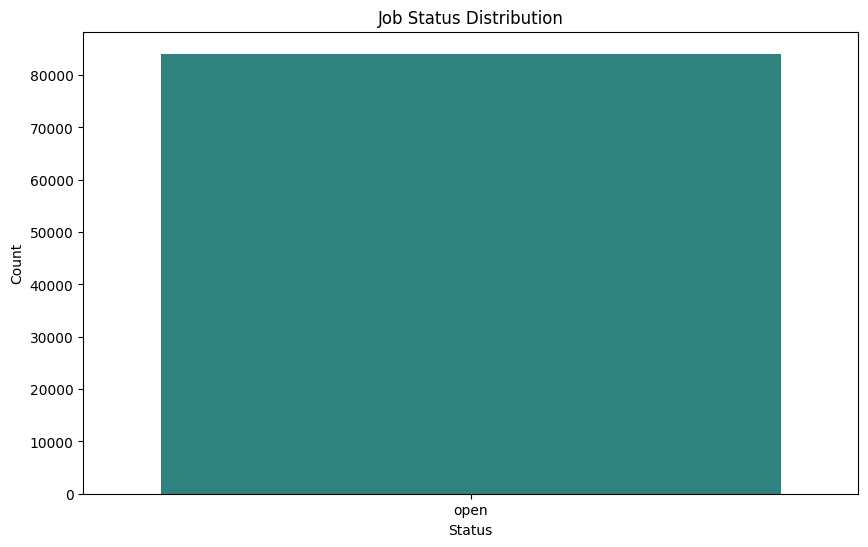

In [19]:
# Visualize data
plt.figure(figsize=(10,6))
sns.countplot(x='Status', data=data, palette='viridis')
plt.title('Job Status Distribution')
plt.xlabel('Status')
plt.ylabel('Count')
plt.show()

In [20]:
# 3D Plot using Plotly for visualizing job positions, companies, and statuses
fig = px.scatter_3d(data, 
                    x='Position', 
                    y='Company', 
                    z='Status', 
                    color='Status', 
                    title="3D Visualization of Job Data",
                    labels={'Position': 'Job Position', 'Company': 'Company', 'Status': 'Job Status'})
fig.update_traces(marker=dict(size=8))
fig.show()

In [21]:
data=data.sample(n=1000,random_state=42)

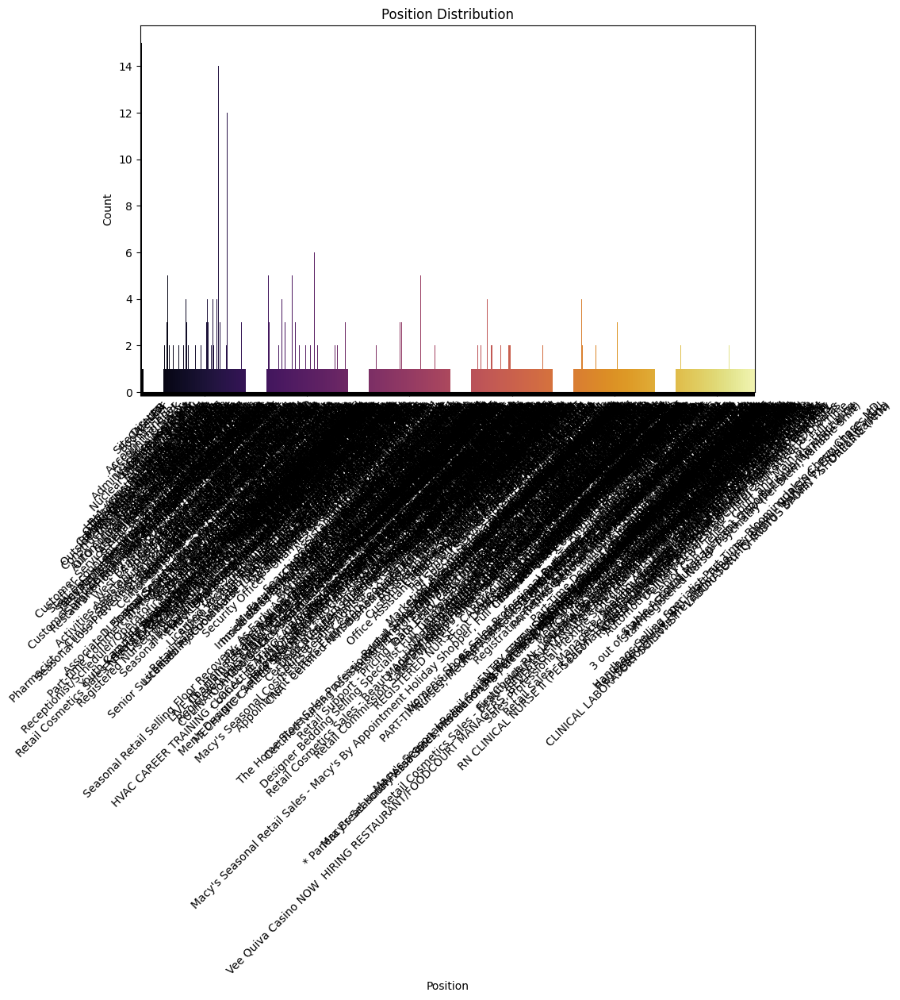

In [22]:
plt.figure(figsize=(10,6))
sns.countplot(x='Position', data=data, palette='inferno')
plt.title('Position Distribution')
plt.xlabel('Position')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


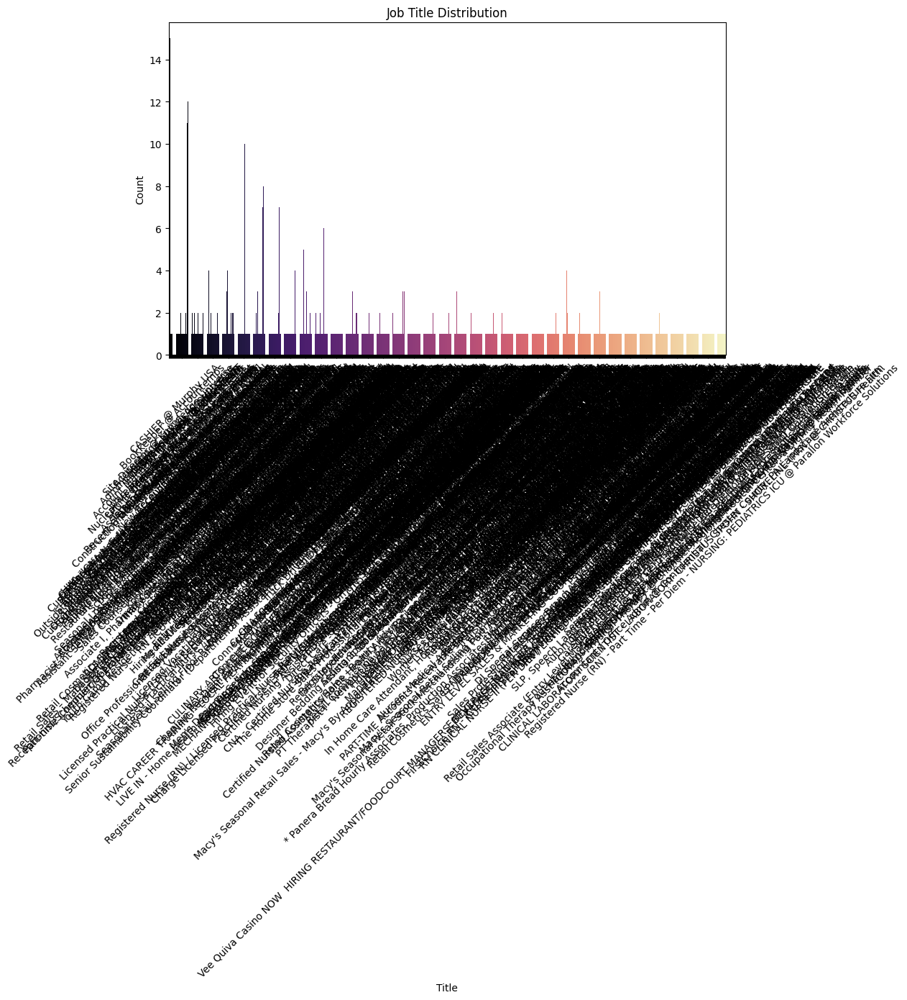

In [23]:
plt.figure(figsize=(10,6))
sns.countplot(x='Title', data=data, palette='magma')
plt.title('Job Title Distribution')
plt.xlabel('Title')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


In [24]:
data.shape

(1000, 5)

# cleaning dataset                            
removing stopwords                            
tokenization                            
stemming     


In [25]:
!pip3 install nltk

In [26]:
from nltk.corpus import stopwords
import nltk
import re
from nltk.stem.porter import PorterStemmer
ps = PorterStemmer()

In [27]:

# Download necessary NLTK datasets
nltk.download('punkt')  # For word tokenization
nltk.download('stopwords')  # For stopwords


[nltk_data] Downloading package punkt to /Users/apple/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/apple/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [28]:
def cleaning(txt):
    txt = re.sub(r'[^a-zA-Z0-9\s]','',txt)
    tokens = nltk.word_tokenize(txt.lower())
    stemming = [ps.stem(w) for w in tokens if w not in stopwords.words('english')]
    return " ".join(stemming)

In [29]:
cleaning("\n\rhelo the master piece is my loving moving cat @9032#%$")

'helo master piec love move cat 9032'

In [30]:
data['Job.Description'] = data['Job.Description'].astype(str).apply(lambda x: cleaning(x))
data['Title'] = data['Title'].astype(str).apply(lambda x: cleaning(x))
data['Position'] = data['Position'].astype(str).apply(lambda x: cleaning(x))

In [34]:
data['clean_text'] = data['Job.Description']+" "+data['Title']+data['Position']

In [35]:
data['clean_text'][64119]

'job summari knowledg univers ku site director site leader inspir children teacher alik learn grow passion educ excel confid teach children adult use nation recogn curriculum framework creat uniqu engag classroom experi commit make site success know meaning relationship children famili team import success fulli engag enthusiast work eager share knowledg other job respons essenti function basic expect site director cours creativ new way meet exceed expect encourag long requir essenti function also met supervis children staff record keep licens record child file lesson plan implement mainten safe welcom classroom environ build relationship commun school recruit new student program applic must strong organiz skill site director knowledg universsite director'

#Vectorization

In [36]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [37]:
tfidf = TfidfVectorizer(stop_words='english')
matrix = tfidf.fit_transform(data['clean_text'])
similarity = cosine_similarity(matrix)

In [38]:
similarity

array([[1.        , 0.04316627, 0.02130696, ..., 0.05100026, 0.02496691,
        0.08041552],
       [0.04316627, 1.        , 0.02936395, ..., 0.03614976, 0.00565543,
        0.02609055],
       [0.02130696, 0.02936395, 1.        , ..., 0.05498248, 0.02958163,
        0.0421649 ],
       ...,
       [0.05100026, 0.03614976, 0.05498248, ..., 1.        , 0.05916377,
        0.11123339],
       [0.02496691, 0.00565543, 0.02958163, ..., 0.05916377, 1.        ,
        0.38566633],
       [0.08041552, 0.02609055, 0.0421649 , ..., 0.11123339, 0.38566633,
        1.        ]])

In [39]:
sorted(list(enumerate(similarity[0])), key=lambda x: x[1], reverse=True)[1:20]

[(276, 0.9733672160046344),
 (730, 0.5181028327841252),
 (81, 0.4930372021581327),
 (917, 0.4930372021581327),
 (252, 0.2586188249624741),
 (128, 0.24717579395360645),
 (360, 0.23667888284546076),
 (825, 0.21873437066871299),
 (629, 0.20890125127614856),
 (38, 0.1826144637473955),
 (245, 0.17963696959926834),
 (114, 0.17265928212738577),
 (254, 0.16808193463151463),
 (298, 0.1446934728453074),
 (59, 0.14245288706027584),
 (940, 0.13974623624562135),
 (195, 0.1368769144343853),
 (284, 0.13626056485920382),
 (965, 0.1357102374627918)]

#Recommendation system

In [40]:
def recommend(title):

        indx = data[data['Title'] == title].index[0]
        indx = data.index.get_loc(indx)
        distances = sorted(list(enumerate(similarity[indx])), key=lambda x: x[1], reverse=True)[1:20]

        jobs = []
        for i in distances:
            jobs.append(data.iloc[i[0]].Title)
        return jobs
        

In [42]:
import pickle
pickle.dump(data,open('df.pkl','wb'))
pickle.dump(similarity,open('similarity.pkl','wb'))

In [43]:
print(pd.__version__)


2.2.2
